In [2]:
using IRQIV
import CSV
using DataFrames
using Interpolations, Statistics
import PyPlot as plt
import NaNStatistics
import Geodesy
import Dates
using TimeZones
import LaTeXStrings
plt.pygui(false) # sets plots to popup instead of inline

# Global camera parameters
fl = 1214.2857142857144 # In pixels - from Seth
include(raw"/Users/evanheberlein/Library/CloudStorage/Box-Box/Cornell/IRQIV.jl/examples/CameraCalibrationHelpers.jl")
# include(raw"/Users/evanheberlein/Library/CloudStorage/Box-Box/Cornell/IRQIV.jl/src/SpatialInterpolation.jl")
Camera = IRQIV.FLIR_SC8303_17mm
ι = IRQIV.IntrinsicCalibrationParameters(Camera)
Img_dims = [784, 1344] # Image dims: 784 x 1344

Threads.nthreads() # Can run in 8 threads

output_dir = "/Users/evanheberlein/Library/CloudStorage/Box-Box/Cornell/CACO/2023/DH_STIV/Outputs/"


"/Users/evanheberlein/Library/CloudStorage/Box-Box/Cornell/CACO/2023/DH_STIV/Outputs/"

In [3]:
# Import GCP data
DH_survey = CSV.read("/Users/evanheberlein/Library/CloudStorage/Box-Box/Cornell/CACO/2023/CornellDuckHarbor2023.csv", DataFrames.DataFrame)
GCPs_8_1_SC = DH_survey[16:64,:] # DataFrames makes first row headers

camutm_SC = GCPs_8_1_SC[37,3:5]
camutm_SC[3] += 2

fmt = Dates.dateformat"yyyy-mm-dd HH:MM:SS.s zzz"
DH_survey_times = ZonedDateTime.(
    replace.(DH_survey."Averaging end", "UTC" => ""),
    fmt)
DH_survey_ET = astimezone.(DH_survey_times, tz"America/New_York")
inds_8_1 = Dates.Date.(DH_survey_ET) .== Dates.Date(2023, 8, 1)
DH_survey_8_1 = DH_survey[inds_8_1,:]

SC_bots_uv_8_1 = [854 564 # SC1 bot
                751 108 # SC2 bot 
                426 64 # SC3 bot
                342 57 # SC4 bot
                287 51 # SC6 bot
                259 141 # SC8 bot
                242 132 # SC9 bot
                228 131 # SC10 bot
                230 226 # SC11 bot
                236 381 # SC12 bot
                344 639 # SC13 bot
                255 593 # NC1 bot
                266 656 # NC7 bot 
]

SC_tops_uv_8_1 = [622 602 # SC1 top
                550 114 # SC2 top
                318 63 # SC3 top
                273 61 # SC4 top
                236 53 # SC6 top
                230 63 # SC7 top
                228 141 # SC8 top
                218 133 # SC9 top
                205 131 # SC10 top
                217 227 # SC11 top
                218 381 # SC12 top
                #229 512 # Stump
                301 651 # SC13 top
                239 594 # NC1 top
                253 659 # NC7 top
]

SC_uv_8_1 = [SC_bots_uv_8_1
    SC_tops_uv_8_1]

SC_bots_xyz_8_1 = GCPs_8_1_SC[25:36,[1,3,4,5]] # Name, Easting, Northing, Elevation
deleteat!(SC_bots_xyz_8_1, 6)
SC_bots_xyz_8_1 = [SC_bots_xyz_8_1
                GCPs_8_1_SC[1:7,[1,3,4,5]]]
deleteat!(SC_bots_xyz_8_1, (13:17))

SC_tops_xyz_8_1 = GCPs_8_1_SC[38:49,[1,3,4,5]] # "
SC_tops_xyz_8_1 = [SC_tops_xyz_8_1
                GCPs_8_1_SC[13:19,[1,3,4,5]]]
deleteat!(SC_tops_xyz_8_1, (14:18))

SC_xyz_8_1_utm = Matrix([SC_bots_xyz_8_1[:,2:4]
                SC_tops_xyz_8_1[:,2:4]])

27×3 Matrix{Float64}:
      4.10794e5  4.64438e6  2.069
      4.10797e5  4.64438e6  2.017
      4.108e5    4.64438e6  1.912
      4.10802e5  4.64439e6  1.816
      4.10805e5  4.64439e6  1.791
      4.10807e5  4.6444e6   1.679
      4.1081e5   4.64441e6  1.722
      4.10812e5  4.64441e6  1.733
      4.10811e5  4.64442e6  1.741
      4.10807e5  4.64443e6  1.819
      ⋮                     
      4.10807e5  4.6444e6   2.696
      4.10808e5  4.6444e6   2.731
      4.1081e5   4.64441e6  2.763
      4.10812e5  4.64441e6  2.771
 410811.0        4.64442e6  2.789
      4.10807e5  4.64443e6  2.864
      4.10795e5  4.6444e6   2.784
      4.10798e5  4.64445e6  2.718
      4.10794e5  4.64444e6  2.655

┌ Warning: Too few BHPHeaders to calculate fps!
└ @ IRQIV.FLIRATSFiles /Users/evanheberlein/Library/CloudStorage/Box-Box/Cornell/IRQIV.jl/src/FLIRATSFiles.jl:415


Finished extrinsic calibration:, 8 iterations, max(|ε|)=4e-10, rms(ε₁-ε₀)=7e-11
ExtrinsicCalibrationParameters


┌ Info: Initial guess, χinitial:
└ @ Main /Users/evanheberlein/Library/CloudStorage/Box-Box/Cornell/CACO/CACO_git/CACO_23_jl/jl_notebook_cell_df34fa98e69747e1a8f8a730347b8e2f_W2sZmlsZQ==.jl:28


  φ: Float64 0.08726646259971647
  τ: Float64 -1.9198621771937625
  σ: Float64 1.5707963267948966
  f: Float64 1214.2857142857144
  x_c: Float64 410794.429
  y_c: Float64 4.64437235e6
  z_c: Float64 5.04
dump(χinitial_SC) = nothing
ExtrinsicCalibrationParameters
  φ: Float64 0.15869781643954087
  τ: Float64 -1.972435537585546
  σ: Float64 1.7057036423637064
  f: Float64 1155.4743546371924
  x_c: Float64 410794.64867768675
  y_c: Float64 4.644372713478437e6
  z_c: Float64 4.551520618100407
dump(χcalculated_SC_8_1) = nothing
φ diff (degrees) -  -4.092715099927545
τ diff (degrees) -  3.012231665269443
σ diff (degrees) -  -7.729619807532348
f diff -  58.81135964852206
x_c diff (meters) -  -0.21967768674949184
y_c diff (meters) -  -0.3634784370660782
z_c diff (meters) -  0.4884793818995927


┌ Info: Calibrated values, χcalculated:
└ @ Main /Users/evanheberlein/Library/CloudStorage/Box-Box/Cornell/CACO/CACO_git/CACO_23_jl/jl_notebook_cell_df34fa98e69747e1a8f8a730347b8e2f_W2sZmlsZQ==.jl:31
┌ Info: Difference between calibrated value and initial guess:
└ @ Main /Users/evanheberlein/Library/CloudStorage/Box-Box/Cornell/CACO/CACO_git/CACO_23_jl/jl_notebook_cell_df34fa98e69747e1a8f8a730347b8e2f_W2sZmlsZQ==.jl:35
┌ Info: (410794.484, 410794.51926754025)
└ @ Main /Users/evanheberlein/Library/CloudStorage/Box-Box/Cornell/IRQIV.jl/examples/CameraCalibrationHelpers.jl:68
┌ Info: (410796.502, 410796.55485607334)
└ @ Main /Users/evanheberlein/Library/CloudStorage/Box-Box/Cornell/IRQIV.jl/examples/CameraCalibrationHelpers.jl:68
┌ Info: (410799.794, 410799.76047922194)
└ @ Main /Users/evanheberlein/Library/CloudStorage/Box-Box/Cornell/IRQIV.jl/examples/CameraCalibrationHelpers.jl:68
┌ Info: (410802.309, 410802.3385787123)
└ @ Main /Users/evanheberlein/Library/CloudStorage/Box-Box/Cornell

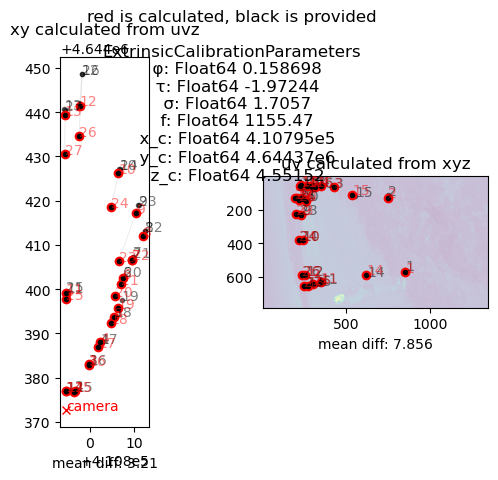

In [4]:
# Camera location calibration setup - south channel

# All converge for 8/1
azimuth_SC_g = deg2rad(5) # Guess from google maps
tilt_SC_g = deg2rad(-110) # From looking straight up?
roll_SC_g = deg2rad(90)

# χinitial_SC = ExtrinsicCalibrationParameters(azimuth_SC_g, tilt_SC_g, roll_SC_g, fl, camutm_SC.x, camutm_SC.y, camutm_SC.z)
χinitial_SC = ExtrinsicCalibrationParameters(azimuth_SC_g, tilt_SC_g, roll_SC_g, fl, camutm_SC.Easting, camutm_SC.Northing, camutm_SC.Elevation)

TrueGCPuv_SC_8_1 = hcat(RemoveRadialDistortion(SC_uv_8_1[:,1], SC_uv_8_1[:,2], Camera)...)

plt.close("all")
GCP_path_SC_8_1 = ("/Volumes/ETH_4TB/DH_IR/Rec-HRE_2023_-003701-__TIME__.ats")
GCP_image_SC_8_1 = LoadATSImageSequence(GCP_path_SC_8_1, 1, 2023)
# GraphicallyExploreInitialCalibrationGuess(TrueGCPuv_SC_8_1, SC_xyz_8_1_utm, χinitial_SC, ι, GCP_image_SC_8_1[1])
# plt.gcf()

# Camera location calibration - south channel
χcalculated_SC_8_1 = ExtrinsicCalibration(
    TrueGCPuv_SC_8_1,
    SC_xyz_8_1_utm,
    χinitial_SC,
    ι,
    MaxIterations = 50,
    PrintoutStats=true)

@info "Initial guess, χinitial:"
@show dump(χinitial_SC)
# 
@info "Calibrated values, χcalculated:"
@show dump(χcalculated_SC_8_1)
# 
# Describe how much the calibration changed each parameter:
@info "Difference between calibrated value and initial guess:"
for (i,x) in enumerate(fieldnames(typeof(χcalculated_SC_8_1)))
    if i <= 3
        println("$x diff (degrees) -  $(rad2deg(getfield(χinitial_SC, x) - getfield(χcalculated_SC_8_1, x)))")
    elseif i == 4
        println("$x diff -  $(getfield(χinitial_SC, x) - getfield(χcalculated_SC_8_1, x))")
    else
        println("$x diff (meters) -  $(getfield(χinitial_SC, x) - getfield(χcalculated_SC_8_1, x))")
    end
end

dlt = IRQIV.DLT(χcalculated_SC_8_1, FLIR_SC8303_17mm)

plt.close("all")
GraphicallyExploreInitialCalibrationGuess(TrueGCPuv_SC_8_1, SC_xyz_8_1_utm, χcalculated_SC_8_1, ι, GCP_image_SC_8_1[1])
plt.gcf()


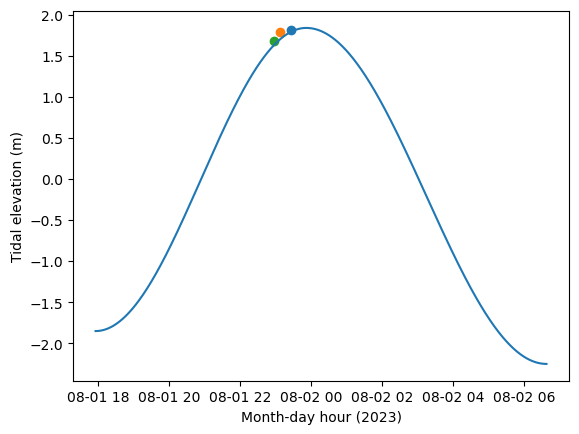

In [5]:
# Reconstruct WSE time vector
using Interpolations

SC4_bot_z = SC_bots_xyz_8_1[4,4]
SC6_bot_z = SC_bots_xyz_8_1[5,4]
SC8_bot_z = SC_bots_xyz_8_1[6,4]
SC_4_uv = SC_bots_uv_8_1[4,:]
SC_12_uv = SC_bots_uv_8_1[10,:]

# Extract FLIR metadata - high WL
FLIR_filename = raw"/Volumes/ETH_4TB/DH_IR/Rec-HRE_2023_-003723-__TIME__.ats"

FLIR_meta_summary = IRQIV.FLIRATSFiles.FindATSFileMetadata(FLIR_filename, ATSfps = NaN, ats_year = 2023)
lastframe = FLIR_meta_summary.EstimatedTotalFrames
_,FLIR_meta_full = IRQIV.FLIRATSFiles.LoadMultipleFrames(FLIR_meta_summary, collect(1:1:lastframe), ats_year=2023, ReadFrame=false)
FLIR_meta_time = TimeZones.ZonedDateTime(
    IRQIV.FLIRATSFiles.ParseBHPHeaderTimestamp(FLIR_meta_full, ats_year = 2023)[1], # First frame corresponds to file modeified time
    TimeZones.tz"America/New_York")
file_meta_time = TimeZones.ZonedDateTime(Dates.unix2datetime(stat(FLIR_filename).mtime), TimeZones.tz"UTC")
file_meta_time = TimeZones.astimezone(file_meta_time, TimeZones.tz"America/New_York")
# Calculate and correct for offset between two metadata times
meta_time_offset_high = FLIR_meta_time - file_meta_time
high_WL_ts = IRQIV.FLIRATSFiles.ParseBHPHeaderTimestamp(FLIR_meta_full, ats_year = 2023) .- meta_time_offset_high

# Extract FLIR metadata - mid WL
FLIR_filename = raw"/Volumes/ETH_4TB/DH_IR/Rec-HRE_2023_-003717-__TIME__.ats"
FLIR_meta_summary = IRQIV.FLIRATSFiles.FindATSFileMetadata(FLIR_filename, ATSfps = NaN, ats_year = 2023)
lastframe = FLIR_meta_summary.EstimatedTotalFrames
_,FLIR_meta_full = IRQIV.FLIRATSFiles.LoadMultipleFrames(FLIR_meta_summary, collect(1:1:lastframe), ats_year=2023, ReadFrame=false)
FLIR_meta_time = TimeZones.ZonedDateTime(
    IRQIV.FLIRATSFiles.ParseBHPHeaderTimestamp(FLIR_meta_full, ats_year = 2023)[1], # First frame corresponds to file modeified time
    TimeZones.tz"America/New_York")
file_meta_time = TimeZones.ZonedDateTime(Dates.unix2datetime(stat(FLIR_filename).mtime), TimeZones.tz"UTC")
file_meta_time = TimeZones.astimezone(file_meta_time, TimeZones.tz"America/New_York")
# Calculate and correct for offset between two metadata times
meta_time_offset_mid = FLIR_meta_time - file_meta_time
mid_WL_ts = IRQIV.FLIRATSFiles.ParseBHPHeaderTimestamp(FLIR_meta_full, ats_year = 2023) .- meta_time_offset_mid

# Extract FLIR metadata - low WL
FLIR_filename = raw"/Volumes/ETH_4TB/DH_IR/Rec-HRE_2023_-003714-__TIME__.ats"
FLIR_meta_summary = IRQIV.FLIRATSFiles.FindATSFileMetadata(FLIR_filename, ATSfps = NaN, ats_year = 2023)
lastframe = FLIR_meta_summary.EstimatedTotalFrames
_,FLIR_meta_full = IRQIV.FLIRATSFiles.LoadMultipleFrames(FLIR_meta_summary, collect(1:1:lastframe), ats_year=2023, ReadFrame=false)
FLIR_meta_time = TimeZones.ZonedDateTime(
    IRQIV.FLIRATSFiles.ParseBHPHeaderTimestamp(FLIR_meta_full, ats_year = 2023)[1], # First frame corresponds to file modeified time
    TimeZones.tz"America/New_York")
file_meta_time = TimeZones.ZonedDateTime(Dates.unix2datetime(stat(FLIR_filename).mtime), TimeZones.tz"UTC")
file_meta_time = TimeZones.astimezone(file_meta_time, TimeZones.tz"America/New_York")
# Calculate and correct for offset between two metadata times
meta_time_offset_low = FLIR_meta_time - file_meta_time
low_WL_ts = IRQIV.FLIRATSFiles.ParseBHPHeaderTimestamp(FLIR_meta_full, ats_year = 2023) .- meta_time_offset_low
meta_time_offset_mean = mean([meta_time_offset_high, meta_time_offset_mid, meta_time_offset_low])

using Dates
tide_hilo = CSV.read(raw"/Users/evanheberlein/Library/CloudStorage/Box-Box/Cornell/CACO/2023/DH_STIV/Wellfleet_NOAA_tide_predictions.txt",
    DataFrame, skipto = 21, delim = "\t", header = false)
rename!(tide_hilo, [:Date, :DOW, :Time, :Height, :HiLo])

tide_hilo.Date = Dates.Date.(tide_hilo[:,1], "yyyy/mm/dd")
tide_hilo.DateTime .= tide_hilo.Date + tide_hilo.Time

function tidal_cycle(low1_time::DateTime, low1_level::Float64,
                     high_time::DateTime, high_level::Float64,
                     low2_time::DateTime, low2_level::Float64;
                     Δt::Minute = Minute(1))

    times = collect(low1_time:Δt:low2_time)
    levels = Float64[]

    for t in times
        if t <= high_time
            # Low → High: cosine half-wave (flat slope at ends)
            φ = (t - low1_time) / (high_time - low1_time) * π
            push!(levels, low1_level + (high_level - low1_level) * (1 - cos(φ)) / 2)
        else
            # High → Low: cosine half-wave (flat slope at ends)
            φ = (t - high_time) / (low2_time - high_time) * π
            push!(levels, high_level + (low2_level - high_level) * (1 - cos(φ)) / 2)
        end
    end

    return DataFrame(time=times, level=levels)
end

tide_preds = tidal_cycle(tide_hilo.DateTime[11], tide_hilo.Height[11],
    tide_hilo.DateTime[12], tide_hilo.Height[12],
    tide_hilo.DateTime[13], tide_hilo.Height[13])

high_comp_ind = argmin(abs.(tide_preds.time .- high_WL_ts[1]))
high_offset = tide_preds.level[high_comp_ind] - SC4_bot_z
mid_comp_ind = argmin(abs.(tide_preds.time .- mid_WL_ts[1]))
mid_offset = tide_preds.level[mid_comp_ind] - SC6_bot_z
low_comp_ind = argmin(abs.(tide_preds.time .- low_WL_ts[1]))
low_offset = tide_preds.level[high_comp_ind] - SC8_bot_z
mean_offset = mean([high_offset, mid_offset, low_offset])

plt.figure()
plt.plot(tide_preds.time, tide_preds.level.-mean_offset)
plt.scatter(high_WL_ts[1], SC4_bot_z)#+mean_offset)
plt.scatter(mid_WL_ts[1], SC6_bot_z)#+mean_offset)
plt.scatter(low_WL_ts[1], SC8_bot_z)#+mean_offset)
# plt.xlim(Dates.DateTime(2022,8,1,22), Dates.DateTime(2022,8,2,2))
# plt.ylim([3.5, 4])
plt.xlabel("Month-day hour (2023)")
plt.ylabel("Tidal elevation (m)")
plt.gcf()

# Create vector of WLs for each file
firstfile = 3712
lastfile = 3748

raw"/Volumes/ETH_4TB/DH_IR/Rec-HRE_2023_-003712-__TIME__.ats"
raw"/Volumes/ETH_4TB/DH_IR/Rec-HRE_2023_-003749-__TIME__.ats"

file_range = firstfile:lastfile
FLIR_meta_timestamps = Vector{TimeZones.ZonedDateTime}(undef, length(file_range))
interpolated_WL = Vector{Float64}(undef, length(file_range))

# Interpolate tidal predictions
tide_t_zoned = ZonedDateTime.(tide_preds.time, TimeZones.tz"America/New_York")
tide_levels = tide_preds.level
tide_dt = DateTime.(tide_t_zoned)   # strip timezone safely
tide_secs = Dates.datetime2unix.(tide_dt)
# tide_t0 = first(tide_dt)
# tide_secs = Float64.(Dates.value.(tide_t_zoned .- tide_t0)) ./ 1000
itp = interpolate((tide_secs,), tide_levels, Gridded(Linear()))

for (ind, file) in enumerate(file_range)
    filepath = "/Volumes/ETH_4TB/DH_IR/Rec-HRE_2023_-00" * string(file) * "-__TIME__.ats"
    file_metadata_summary = IRQIV.FLIRATSFiles.FindATSFileMetadata(filepath, ATSfps = NaN, ats_year = 2023)
    _, file_metadata_full = IRQIV.FLIRATSFiles.LoadSingleFrame(file_metadata_summary, 1, ats_year=2023, ReadFrame=false)
    FLIR_meta_timestamps[ind] = TimeZones.ZonedDateTime(
        IRQIV.FLIRATSFiles.ParseBHPHeaderTimestamp(file_metadata_full, ats_year = 2023), # First frame corresponds to file modeified time
        TimeZones.tz"America/New_York"
    )
    zdt = round(FLIR_meta_timestamps[ind], Dates.Second)
    t = FLIR_meta_timestamps[ind]
    # t_sec = Float64(Dates.value(t - tide_t0)) / 1000
    t_sec = Dates.datetime2unix(DateTime(zdt))
    interpolated_WL[ind] = itp(t_sec) - mean_offset
end

plt.gcf()
# interpolated_WL 


In [6]:
# Set up transect across overwash channel between GCPs @ WSE

function bresenham_line(x0, y0, x1, y1)
    pixels = []
    dx = abs(x1 - x0)
    dy = abs(y1 - y0)
    sx = x0 < x1 ? 1 : -1
    sy = y0 < y1 ? 1 : -1
    err = dx - dy

    while true
        push!(pixels, (x0, y0))
        if x0 == x1 && y0 == y1
            break
        end
        e2 = 2 * err
        if e2 > -dy
            err -= dy
            x0 += sx
        end
        if e2 < dx
            err += dx
            y0 += sy
        end
    end
    return pixels
end

transect_uv = bresenham_line(SC_4_uv[1], SC_4_uv[2], SC_12_uv[1], SC_12_uv[2])
true_transect_uv = [(u, v) for (u, v) in 
    zip(IRQIV.RemoveRadialDistortion(first.(transect_uv), 
        last.(transect_uv), Camera)...)]
transect_xy = fill((0.0, 0.0), length(true_transect_uv))
for (coord_ind, coord) in enumerate(true_transect_uv)
    # v_ind, u_ind = coord
    u_ind, v_ind = coord
    x_coord, y_coord = IRQIV.uvz2xy(u_ind, v_ind, SC4_bot_z, dlt)
    transect_xy[coord_ind] = (x_coord, y_coord)
end

In [7]:
# Functions for placing/clipping STIV sampling lines
# Find points at edge of image from each start point
function bottom_edge_intersection(start_points_uv, σ, Img_dims)
    bottom_v = Img_dims[1]
    intersections = Vector{Union{Tuple{Int,Int}, Nothing}}(undef, length(start_points_uv))

    for (i, (u0, v0)) in enumerate(start_points_uv)
        sinσ = sin(σ)
        cosσ = cos(σ)

        if sinσ > 0  # Line goes downward
            t = (bottom_v - v0) / -sinσ
            u_edge = u0 + t * cosσ

            # Ensure horizontal coordinate is within image bounds
            if 1 ≤ u_edge ≤ Img_dims[2]
                intersections[i] = (round(Int, u_edge), bottom_v)
            else
                intersections[i] = nothing
            end
        else
            # Line does not reach bottom
            intersections[i] = nothing
        end
    end

    return intersections
end
# Clip to set range for each line
function clip_indices_within_distance(transect_xy_lines, max_distance)
    clipped_indices = Vector{Vector{Int}}(undef, length(transect_xy_lines))

    for (i, line) in enumerate(transect_xy_lines)
        start_point = line[1]
        inds = Int[]

        for (j, point) in enumerate(line)
            dx = point[1] - start_point[1]
            dy = point[2] - start_point[2]
            dist = sqrt(dx^2 + dy^2)
            if dist <= max_distance
                push!(inds, j)
            else
                break  # all subsequent points will be farther away
            end
        end

        clipped_indices[i] = inds
    end

    return clipped_indices
end
# Return bounding box of all lines with buffer
function line_bounds(lines, buffer=0; imgsize=nothing)
    # line_coords are (v, u) pairs (row, column)
    u_coords = [p[1] for line in lines for p in line]
    v_coords = [p[2] for line in lines for p in line]

    # Apply padding but clip to image boundaries
    vmin = max(1, minimum(v_coords) - buffer)
    vmax = min(imgsize[1], maximum(v_coords) + buffer)
    umin = max(1, minimum(u_coords) - buffer)
    umax = min(imgsize[2], maximum(u_coords) + buffer)

    return umin, umax, vmin, vmax
end

# STIV function definitions
import Images, FFTW, StaticArrays, LinearAlgebra

function point_in_polygon(poly_xs::Vector{T}, poly_ys::Vector{T}, x::T, y::T) where T<: Real
    n_verts = length(poly_xs)
    j = n_verts
    c = false
    for i in 1:n_verts
        if (((poly_ys[i] <= y) && (y < poly_ys[j])) || ((poly_ys[j] <= y) && (y < poly_ys[i]))) && 
            (x < (poly_xs[j] - poly_xs[i]) * (y - poly_ys[i]) / (poly_ys[j] - poly_ys[i]) + poly_xs[i])
            c = !c
        end
        j = i
    end
    return c
end

function draw_polygon!(mask::Matrix{Bool}, poly_xs::Vector{Int}, poly_ys::Vector{Int})
    min_x, max_x = max(minimum(poly_xs), 1), min(maximum(poly_xs), size(mask, 2))
    min_y, max_y = max(minimum(poly_ys), 1), min(maximum(poly_ys), size(mask, 1))
    for y in min_y:max_y
        for x in min_x:max_x
            if point_in_polygon(poly_xs, poly_ys, x, y)
                mask[y, x] = true
            end
        end
    end
end

function polygons_to_mask(polygons::Array{Matrix{T}, 1} where T <: Real, max_x::Int, max_y::Int)::Matrix{Bool}
    poly_mask = zeros(Bool, max_y, max_x)  # Initialize a Bool matrix with all values set to false
    for p in polygons
        draw_polygon!(poly_mask, round.(Int, p[:, 1]), round.(Int, p[:, 2]))
    end
    return poly_mask
end

function centered_moving_average(vs, n)
    len = length(vs)
    vs_extended = vcat(vs[end-div(n,2)+1:end], vs, vs[1:div(n,2)])  # Wrap around
    return [sum(@view vs_extended[i:(i+n-1)]) / n for i in 1:len]
end

function align_zero_min_expand(ax_ref, ax_target; pad_frac=0.02)
    """
    Align y=0 on ax_target to ax_ref, expanding ax_target's span
    by the minimal amount needed (plus pad_frac) so no data is cut off.
    """
    # 1) Reference zero relative position
    y0r, y1r = ax_ref.get_ylim()
    rel0 = (0 - y0r) / (y1r - y0r)

    # 2) Target data extents
    dmin, dmax = ax_target.dataLim.ymin, ax_target.dataLim.ymax
    pad = pad_frac * (dmax - dmin)

    # 3) Compute required spans so data + pad fit above and below zero:
    #    below zero we need b ≤ dmin - pad  where b = -rel0*s
    #    above zero we need b + s ≥ dmax + pad  ⇒ -rel0*s + s ≥ dmax + pad
    # Solve each:
    s_req1 = (dmax + pad) / (1 - rel0)
    s_req2 = -(dmin - pad) / rel0

    # 4) Take the largest requirement, or keep original if it's already big enough
    y0t, y1t = ax_target.get_ylim()
    orig_span = y1t - y0t
    new_span = max(orig_span, s_req1, s_req2)

    # 5) Compute new bottom b so that zero is at rel0 * new_span
    new_y0 = -rel0 * new_span
    new_y1 = new_y0 + new_span

    ax_target.set_ylim(new_y0, new_y1)
    ax_ref.axhline(0, color="gray", linewidth=1)
end

function normal_component(stiv_line_xy, ref_start_xy, ref_end_xy, v_stiv)
    # Reference transect direction
    ref_vec = StaticArrays.SVector(ref_end_xy...) - StaticArrays.SVector(ref_start_xy...)
    ref_unit = ref_vec / LinearAlgebra.norm(ref_vec)

    # STIV line direction (first → last point of this line)
    stiv_vec = StaticArrays.SVector(stiv_line_xy[end]...) - StaticArrays.SVector(stiv_line_xy[1]...)
    stiv_unit = stiv_vec / LinearAlgebra.norm(stiv_vec)

    # Angle between STIV line and transect
    cosθ = clamp(LinearAlgebra.dot(stiv_unit, ref_unit), -1, 1)
    θ = acosd(cosθ)

    # Normal component of STIV velocity
    return v_stiv * sind(θ), θ
end

using Random

"""
Bootstrap discharge and store depth/velocity means per line.
Returns:
  Q_boot::Vector{Float64}      length B
  mean_depths_boot::Matrix     nlines × B
  mean_vels_boot::Matrix       nlines × B
"""
function bootstrap_Q_distributions(depths::AbstractMatrix{T}, vels::AbstractMatrix{T},
                                   dx::T; B::Int=1000,
                                   rng=Random.GLOBAL_RNG) where {T<:Real}
    nt, nl = size(depths)
    Q_boot = Vector{Float64}(undef, B)
    mean_depths_boot = Matrix{Float64}(undef, nl, B)
    mean_vels_boot   = Matrix{Float64}(undef, nl, B)

    # valid paired indices per line
    valid_inds = [findall(!isnan, depths[:,j] .+ vels[:,j]) for j in 1:nl]

    for b in 1:B
        boot_depths = fill(NaN, nl)
        boot_vels   = fill(NaN, nl)

        for j in 1:nl
            inds = valid_inds[j]
            nj = length(inds)
            if nj == 0
                continue
            end
            samp = rand(rng, inds)       
            boot_depths[j] = depths[samp, j]
            boot_vels[j] = vels[samp, j]
        end

        # store per-line means
        mean_depths_boot[:, b] .= boot_depths
        mean_vels_boot[:, b] .= boot_vels

        # discharge (omit NaNs)
        ok = .!isnan.(boot_depths) .& .!isnan.(boot_vels)
        Q_boot[b] = sum(dx * boot_depths[ok] .* boot_vels[ok])
    end

    return Q_boot, mean_depths_boot, mean_vels_boot
end




bootstrap_Q_distributions

┌ Info: Processing file 1 of 37
└ @ Main /Users/evanheberlein/Library/CloudStorage/Box-Box/Cornell/CACO/CACO_git/CACO_23_jl/jl_notebook_cell_df34fa98e69747e1a8f8a730347b8e2f_W6sZmlsZQ==.jl:65
┌ Info: Saved frame 1
└ @ Main /Users/evanheberlein/Library/CloudStorage/Box-Box/Cornell/CACO/CACO_git/CACO_23_jl/jl_notebook_cell_df34fa98e69747e1a8f8a730347b8e2f_W6sZmlsZQ==.jl:446
┌ Info: Processing file 2 of 37
└ @ Main /Users/evanheberlein/Library/CloudStorage/Box-Box/Cornell/CACO/CACO_git/CACO_23_jl/jl_notebook_cell_df34fa98e69747e1a8f8a730347b8e2f_W6sZmlsZQ==.jl:65
┌ Info: Saved frame 2
└ @ Main /Users/evanheberlein/Library/CloudStorage/Box-Box/Cornell/CACO/CACO_git/CACO_23_jl/jl_notebook_cell_df34fa98e69747e1a8f8a730347b8e2f_W6sZmlsZQ==.jl:446
┌ Info: Processing file 3 of 37
└ @ Main /Users/evanheberlein/Library/CloudStorage/Box-Box/Cornell/CACO/CACO_git/CACO_23_jl/jl_notebook_cell_df34fa98e69747e1a8f8a730347b8e2f_W6sZmlsZQ==.jl:65
┌ Info: Saved frame 3
└ @ Main /Users/evanheberlein/Librar

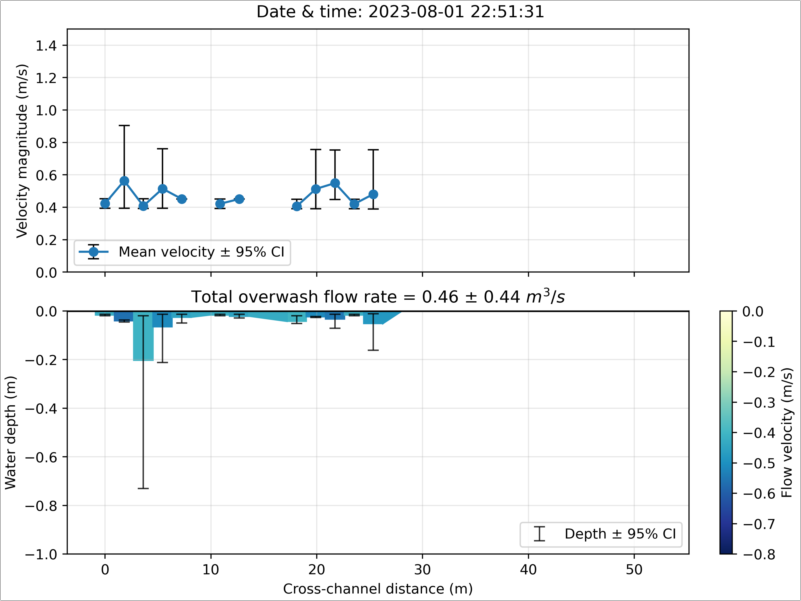

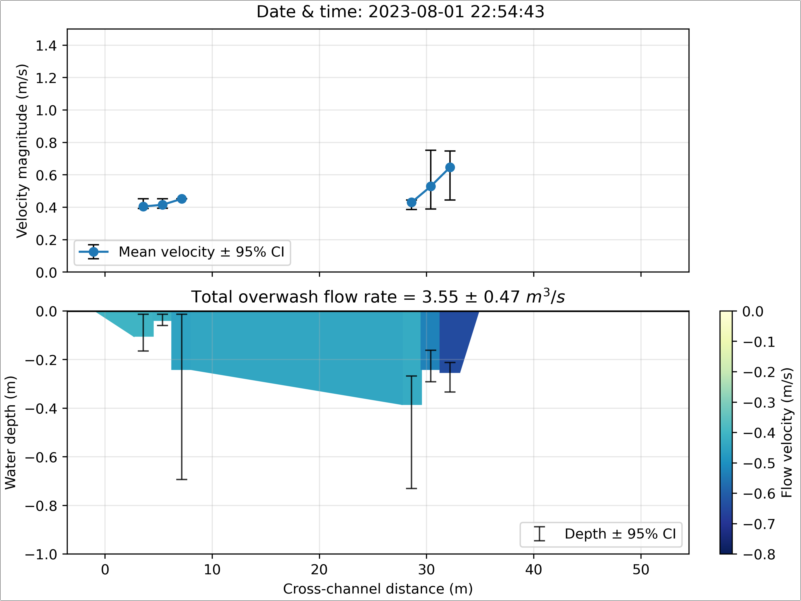

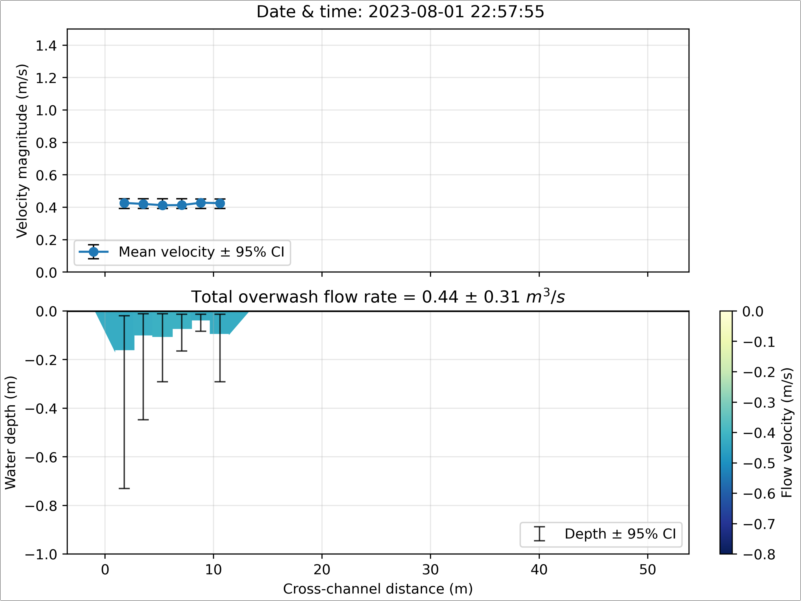

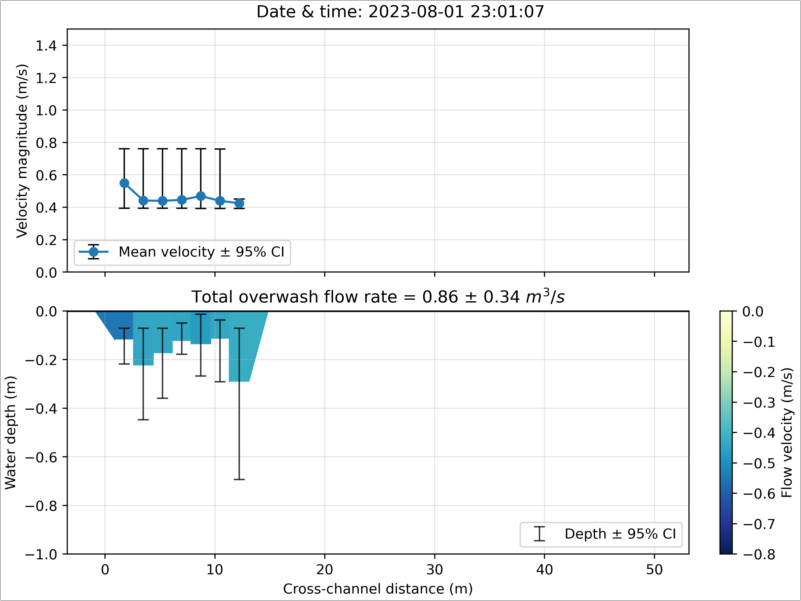

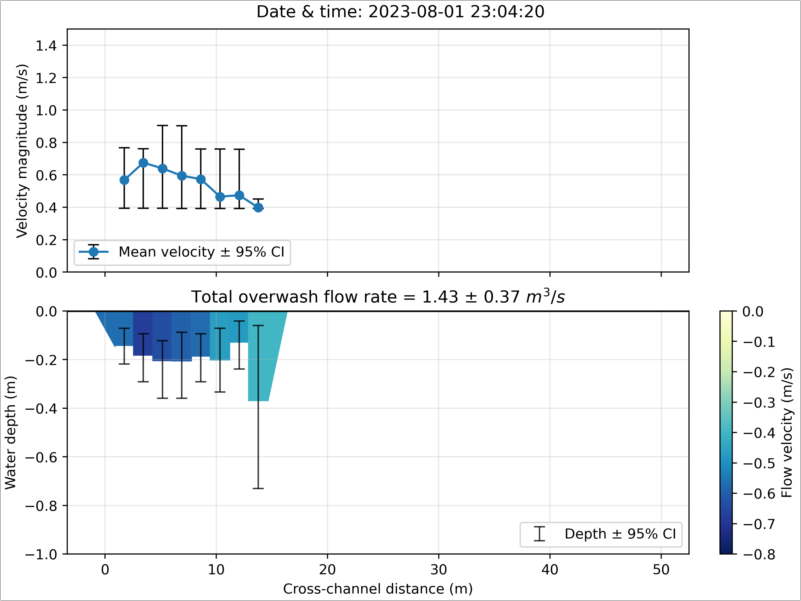

...

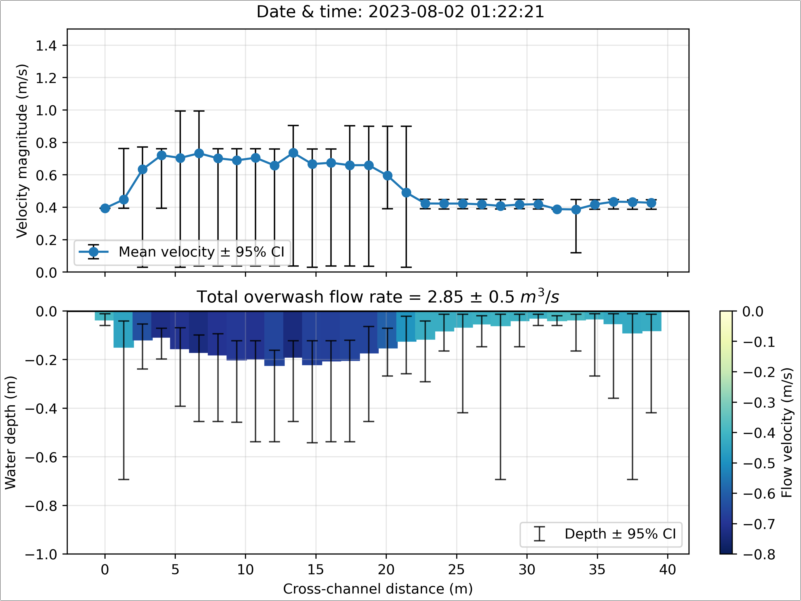

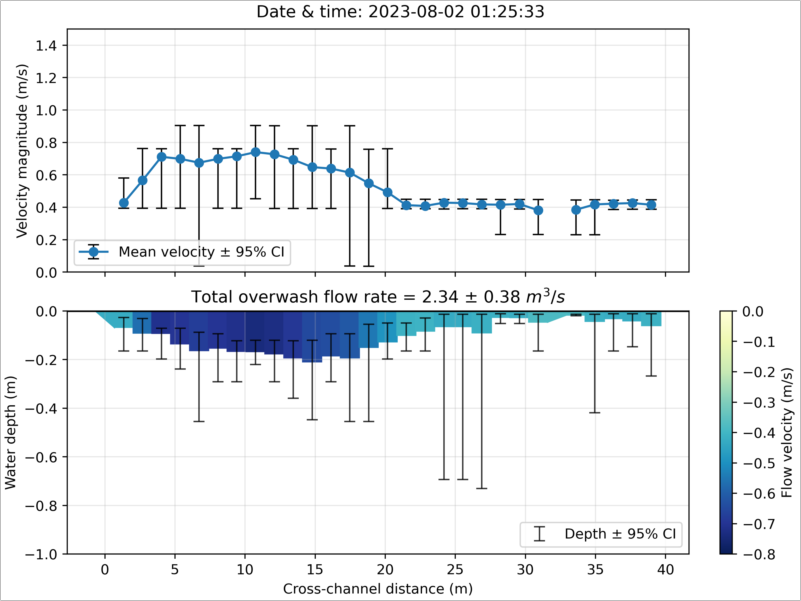

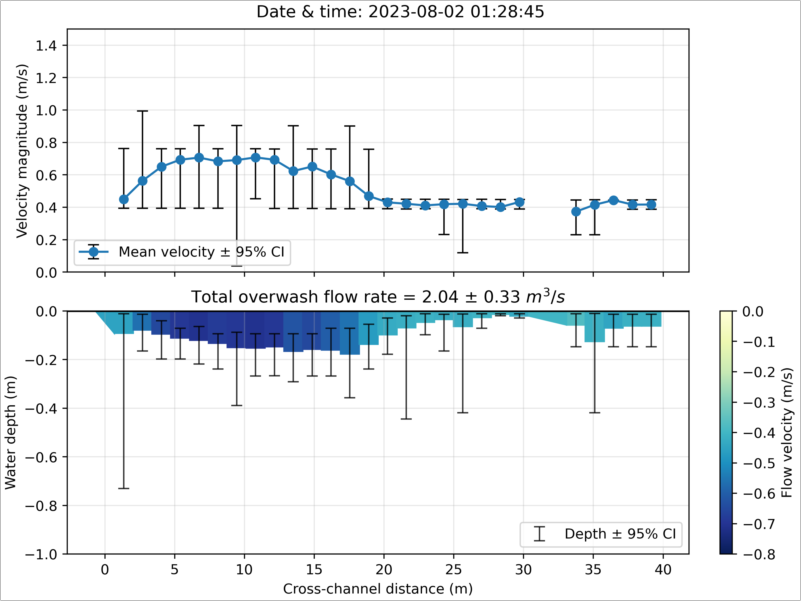

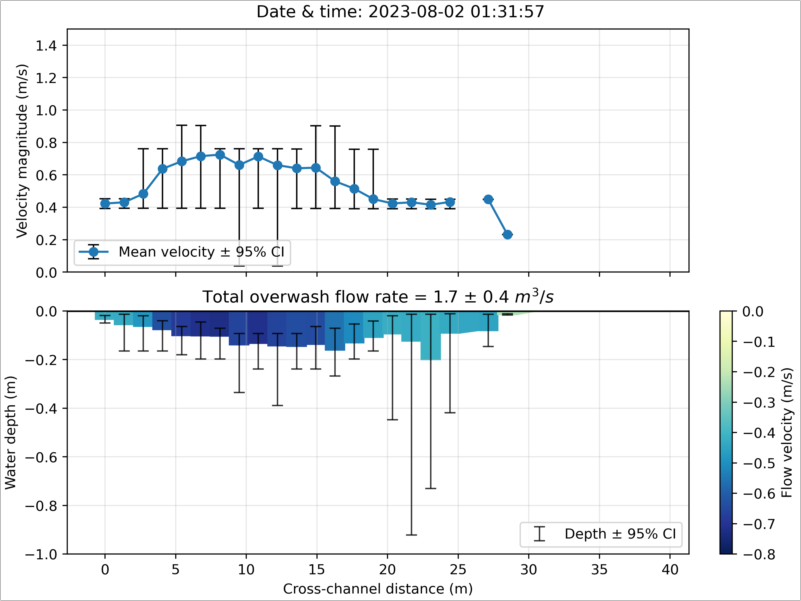

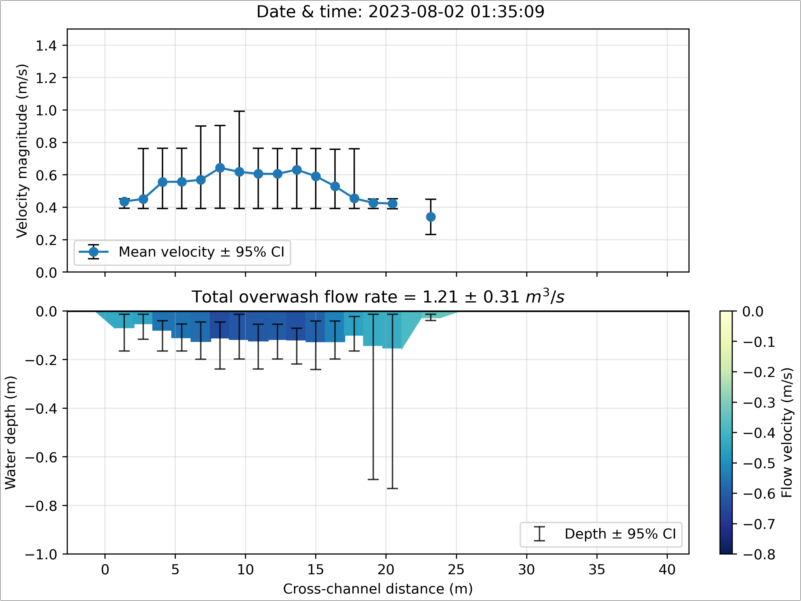

PyCall.PyError: PyError ($(Expr(:escape, :(ccall(#= /Users/evanheberlein/.julia/packages/PyCall/1gn3u/src/pyfncall.jl:43 =# @pysym(:PyObject_Call), PyPtr, (PyPtr, PyPtr, PyPtr), o, pyargsptr, kw))))) <class 'ValueError'>
ValueError("'yerr' must not contain negative values")
  File "/Users/evanheberlein/.julia/conda/3/aarch64/lib/python3.10/site-packages/matplotlib/__init__.py", line 1446, in inner
    return func(ax, *map(sanitize_sequence, args), **kwargs)
  File "/Users/evanheberlein/.julia/conda/3/aarch64/lib/python3.10/site-packages/matplotlib/axes/_axes.py", line 3636, in errorbar
    raise ValueError(


In [ ]:
# BIG LOOP - file-dependent steps
using FileIO
using ImageMagick
using Printf
frames = String[]
# Highly recommended in loops
ENV["MPLBACKEND"] = "Agg"

nframes = 201 # approx. 10 sec
ntimesteps = 50
file_step_factors = round.(Int, range(101, stop = 3500, length = ntimesteps)) .- 100
file_step = 1

# STIV setup
line_length_m = 5
moving_avg_n = 5
AngleIncrement = 1
AngleVec = 1:1*AngleIncrement:180
μ = zeros(Float64, length(AngleVec))
center = Int(ceil(nframes/2))
radius = center-1
θ_c = range(1, stop = 360, length = 360)
xc = radius * cosd.(θ_c) .+ center
yc = radius * sind.(θ_c) .+ center
circ_mask = polygons_to_mask([hcat(xc, yc)], center+radius, center+radius)
circ_nan = ones(Float64, size(circ_mask))
circ_nan[.!circ_mask] .= NaN

Sx = line_length_m/nframes
k = 0.85 # velocity index
n_verticals = 30 # USGS guidance says 25-30

# Pre-compute polar coordinate matrices
θ = zeros(Float64, nframes, nframes)
ρ = zeros(Float64, nframes, nframes)
Tx = zeros(Float64, nframes, nframes)
Ty = zeros(Float64, nframes, nframes)
M = 15  # "coefficient of intensification"
for i in 1:nframes
    for j in 1:nframes
        if circ_mask[i, j]
            Tx[i,j] = center - j
            Ty[i,j] = center - i
            θ[i,j] = atand(Ty[i,j] / Tx[i, j]) # -90 to 90
            ρ[i,j] = M * log(sqrt(Tx[i,j]^2 + Ty[i,j]^2)) 
        end
    end
end
ρ = ρ .* circ_nan
θ = θ .* circ_nan

depths = fill(NaN, length(file_step_factors), n_verticals, length(file_range))
velocities = fill(NaN, length(file_step_factors), n_verticals, length(file_range))
df = DataFrame(
    timestamp = Vector{Union{Missing,String}}(missing, length(file_range)),
    discharge = Vector{Union{Missing,Float64}}(missing, length(file_range)),
    Q_CI      = Vector{Union{Missing,Float64}}(missing, length(file_range))
)

for (file_ind, file) in enumerate(file_range)
# file_ind = 1
# file = file_range[file_ind]
    FLIR_filename = "/Volumes/ETH_4TB/DH_IR/Rec-HRE_2023_-00" * string(file) * "-__TIME__.ats"
    @info "Processing file $file_ind of $(length(file_range))"
    timestamp = nothing

    WSE = interpolated_WL[file_ind]
    # Find length of transect at each WSE
    transect_start_xy = IRQIV.uvz2xy(first.(true_transect_uv)[1], 
        last.(true_transect_uv)[1], WSE, dlt)
    transect_end_xy = IRQIV.uvz2xy(first.(true_transect_uv)[end], 
        last.(true_transect_uv)[end], WSE, dlt)
    delta_x = transect_end_xy[1] - transect_start_xy[1]
    delta_y = transect_end_xy[2] - transect_start_xy[2]
    transect_length = sqrt(delta_x^2 + delta_y^2)
    distances = LinRange(0, transect_length, n_verticals)
    dx = step(distances)

    start_vec = StaticArrays.SVector(transect_start_xy...)
    delta_vec = StaticArrays.SVector(delta_x, delta_y)
    # Solve for n points equally spaced
    equidistant_points = [start_vec + (distance / transect_length) * delta_vec for distance in distances]
    start_point_indices = []
    for eq_point in equidistant_points
        # Find the pixel in shadow_pixels_xy that has the minimum distance to eq_point
        distances_to_pixels = [LinearAlgebra.norm(eq_point .- pixel) for pixel in transect_xy]
        min_index = argmin(distances_to_pixels)  # Find the index of the minimum distance
        push!(start_point_indices, min_index)
    end
    # Find indices of uv vector where equally spaced points land
    start_points_uv = transect_uv[start_point_indices] # u,v (long side, short side)
    bottom_edge_points = bottom_edge_intersection(start_points_uv, χcalculated_SC_8_1.σ, Img_dims)
    # Bresenham line to find pixels for each STIV sampling line from start point
    all_lines_pixels = Vector{Vector{Tuple{Int,Int}}}(undef, length(start_points_uv))
    for i in 1:length(start_points_uv)
        start_uv = start_points_uv[i]
        edge_uv = bottom_edge_points[i]

        if edge_uv !== nothing
            # Compute Bresenham line between start and edge
            all_lines_pixels[i] = bresenham_line(start_uv[1], start_uv[2], edge_uv[1], edge_uv[2])
        else
            all_lines_pixels[i] = Tuple{Int,Int}[]  # empty line if no intersection
        end
    end
    # Convert to xy coords
    true_lines_pixels = [
        [(u, v) for (u, v) in zip(
            IRQIV.RemoveRadialDistortion(first.(line), last.(line), Camera)...
        )]
        for line in all_lines_pixels
    ]
    true_lines_xy = [
        begin
            xy_line = Vector{Tuple{Float64, Float64}}(undef, length(line))
            for (coord_ind, (u_ind, v_ind)) in enumerate(line)
                x_coord, y_coord = IRQIV.uvz2xy(u_ind, v_ind, WSE, dlt)
                xy_line[coord_ind] = (x_coord, y_coord)
            end
            xy_line
        end
        for line in true_lines_pixels
    ]
    # Clip search lines to 5m
    clipped_lines_pixels = [line[inds] for (line, inds) in # u,v (long, short)
        zip(all_lines_pixels, clip_indices_within_distance(true_lines_xy, line_length_m))]
    clipped_lines_xy = [line[inds] for (line, inds) in # u,v (long, short)
        zip(true_lines_xy, clip_indices_within_distance(true_lines_xy, line_length_m))]
    umin, umax, vmin, vmax = line_bounds(clipped_lines_pixels, 10; imgsize = Img_dims)
    # Isolate portion of image where sampling lines are located for interpolation
    shifted_sampling_lines = [[(u - umin + 1, v - vmin + 1) for (u, v) in line] for line in clipped_lines_pixels]
    xy_lines_uniform = Vector{Vector{Tuple{Float64, Float64}}}(undef, length(clipped_lines_xy))
    uv_lines_shifted = Vector{Vector{Tuple{Float64, Float64}}}(undef, length(clipped_lines_xy))
    for (ind, line) in enumerate(clipped_lines_xy)
        xstart = clipped_lines_xy[ind][1][1]
        ystart = clipped_lines_xy[ind][1][2]
        xend = clipped_lines_xy[ind][end][1]
        yend = clipped_lines_xy[ind][end][2]
        dist = sqrt.((xstart-xend).^2 .+ (ystart-yend).^2)
        xy_lines_uniform[ind] = [(xstart + t*(xend - xstart), ystart + t*(yend - ystart))
            for t in range(0, 1, length=nframes)]
        uv_lines_shifted[ind] = [IRQIV.xyz2uv(x, y, WSE, dlt) .- (umin + 1, vmin + 1)
            for (x, y) in xy_lines_uniform[ind]]
    end

    for file_step in 1:length(file_step_factors)
        if
        IRimages = LoadATSImageSequence(FLIR_filename, 
            file_step_factors[file_step]:file_step_factors[file_step]+nframes-1, 2023)
        median_subset = median(IRimages[vmin:vmax, umin:umax, :], dims = 3)
        St = 1/IRimages.Metadata.Estimatedfps
        timestamp = Dates.format(IRimages.Metadata.FirstFrameTimestamp - meta_time_offset_mean, "yyyy-mm-dd HH:MM:SS")

        for (line_ind, line) in enumerate(uv_lines_shifted)
            # Step 1: Extract physical coordinates along the line
            line_xy = [true_lines_xy[line_ind][coord] for coord in 1:length(line)]
            x_coords = [p[1] for p in line_xy]  # physical x
            y_coords = [p[2] for p in line_xy]  # physical y
            
            # Step 2: Collect pixel intensities along the line for each image
            STIV_square = zeros(nframes, nframes)
            for img = 1:nframes
                # image = IRimages[:,:,img] .- mean(IRimages[:,:,img])
                image_subset = IRimages[vmin:vmax, umin:umax, img] .- median_subset # Remove median from each pixel in interpolated region
                image_subset = dropdims(image_subset, dims = 3)
                # image_subset .-= minimum(IRimages[vmin:vmax, umin:umax, :], dims = 3)
                itp_subset = interpolate(image_subset, BSpline(Quadratic(Line())), OnGrid())
                for (coord, (j,i)) in enumerate(line)
                    STIV_square[coord, img] = itp_subset(i,j)
                end
            end
            # STIV_square = STIV_square .- median(STIV_square, dims=2) # Keep, removes stationary features
            orig_min, orig_max = extrema(STIV_square)
           
            # Step 4: run STIV
            # Compute the 2D Fourier transform and the power spectrum
            Rxy = FFTW.ifft(abs.(FFTW.fft(STIV_square)).^2) ./ length(STIV_square)
            Rxy = FFTW.fftshift(abs.(Rxy)) # Seems important - shifts zero-frequency component to center of spectrum  
            # Apply the circular mask to Rxy
            Rxy_pol_norm = Rxy .* circ_nan ./ Rxy[center, center]
            # Aggregate by polar coordinates
            inds_vec = zeros(Int, length(AngleVec))
            μ = zeros(Float64, length(AngleVec))
            ρ_max = M*log(minimum([maximum(filter(!isnan,Tx)),maximum(filter(!isnan,Ty))]))
            for i in 1:length(AngleVec)
                a = i-90 # Convert index back to angle of theta
                inds = findall(θ -> round(θ) == a, θ[:])
                inds_vec[i] = length(inds)
                Rxy_int = sum(Rxy_pol_norm[inds])/inds_vec[i] # Normalize by # of pixels within each degree - varies widely!
                # Rxy_int = sum(Rxy_pol_norm[inds])^2/inds_vec[i] # Flight C
                μ[i] = (1/ρ_max)*Rxy_int
            end
            μ_avg = centered_moving_average(μ, moving_avg_n)
            φ = argmax(μ_avg) - 90
            μ_norm = μ_avg ./ maximum(μ_avg)

            if φ == 90 || φ >= 0
                continue
            end

            # result = find_isolated_peak(μ_avg, 90, φ+90; radius = 5, buffer = 10)
            # if result === nothing # If can't find bulk vel, can't correct wave speed
            #     continue
            # end
            # bulk_idx, _, _ = result
            # bulk_angle = AngleVec[bulk_idx] - 90
            # push!(peak_ratio_vec, μ_norm[bulk_idx]/minimum(μ_norm[φ+90:bulk_idx]))

            # Calculate derivatives
            d2μ_dθ2 = similar(μ_norm)
            d2μ_dθ2[1] = NaN
            d2μ_dθ2[end] = NaN
            # central differences for interior points
            @inbounds for i in 2:length(μ_norm)-1
                d2μ_dθ2[i] = (μ_norm[i+1] - 2*μ_norm[i] + μ_norm[i-1]) / (AngleIncrement^2)
            end
            zero_idx = findfirst(==(90), AngleVec)  # θ = 0 reference
            crossings2 = findall(i ->
                !isnan(d2μ_dθ2[i]) &&
                !isnan(d2μ_dθ2[i+1]) &&
                d2μ_dθ2[i] * d2μ_dθ2[i+1] < 0,
                1:length(d2μ_dθ2)-1
            )
            zc_after_phi = filter(i -> i > argmax(μ_avg), crossings2)
            isempty(zc_after_phi) && continue
            first_zc = first(zc_after_phi)
            bulk_range = first_zc+1 : zero_idx-3 # Avoid negative noise peak in 2nd derivative at -2 degrees
            isempty(bulk_range) && continue
            bulk_idx = bulk_range[argmin(d2μ_dθ2[bulk_range])]
            bulk_angle = AngleVec[bulk_idx] - 90

            bulk_vel = Sx/St*tand(bulk_angle)
            wave_vel = Sx/St*tand(φ) - bulk_vel
            depth = wave_vel^2/9.81
            if depth > 1 || depth < 0.01 # less than 1cm #depth <= 0
                continue
            end

            velocities[file_step, line_ind, file_ind] = bulk_vel * k
            depths[file_step, line_ind, file_ind] = depth
        end
    end

    # Final figure
    ref_start_xy = true_lines_xy[1][1]   # first point of first line
    ref_end_xy   = true_lines_xy[end][1] # first point of last line

    velocities_normal = fill(NaN, length(file_step_factors), n_verticals)
    for y in 1:n_verticals
        for t in 1:length(file_step_factors)
            stiv_line = true_lines_xy[y]          # line geometry for vertical y
            v_stiv = velocities[t, y, file_ind]         # raw velocity magnitude (your input)
            v_norm, θ_norm = normal_component(stiv_line, ref_start_xy, ref_end_xy, v_stiv)

            velocities_normal[t, y] = v_norm              # store normal velocity
        end
        if count(!isnan, velocities_normal[:, y]) < 2
            velocities_normal[:, y] .= NaN
            depths[:, y, file_ind] .= NaN
        end
    end

    Q_boot, depth_boot, vel_boot = bootstrap_Q_distributions(depths[:,:,file_ind], velocities_normal, dx)

    # Example data
    indices = 1:n_verticals

    mean_depths = NaNStatistics.nanmean(depths[:,:,file_ind], dims = 1)[:]
    mean_velocities = NaNStatistics.nanmean(velocities_normal, dims = 1)[:]

    # 95% confidence intervals (or any quantiles you want)
    q = [0.025, 0.975]
    depth_ci = [ all(isnan.(row)) ? fill(NaN, length(q)) : quantile(filter(!isnan, row), q)
                for row in eachrow(depth_boot) ]
    vel_ci = [ all(isnan.(row)) ? fill(NaN, length(q)) : quantile(filter(!isnan, row), q)
                for row in eachrow(vel_boot) ]

    # Extract lower/upper error bar sizes for plotting
    depth_err_lower = mean_depths .- first.(depth_ci)
    depth_err_upper = last.(depth_ci) .- mean_depths
    vel_err_lower = mean_velocities .- first.(vel_ci)
    vel_err_upper = last.(vel_ci) .- mean_velocities
    tolerance = 1e-6
    # vel_err_lower[vel_err_lower .< tolerance] .= 0
    # vel_err_upper[vel_err_upper .< tolerance] .= 0
    # depth_err_lower[depth_err_lower .< tolerance] .= 0
    # depth_err_upper[depth_err_upper .< tolerance] .= 0
    zero_err_inds = (vel_err_lower .<= tolerance) .& (vel_err_upper .<= tolerance) .& (depth_err_lower .<= tolerance) .& (depth_err_upper .<= tolerance)
    mean_velocities[zero_err_inds] .= NaN
    mean_depths[zero_err_inds] .= NaN
    vel_err_lower[zero_err_inds] .= NaN
    vel_err_upper[zero_err_inds] .= NaN
    depth_err_lower[zero_err_inds] .= NaN
    depth_err_upper[zero_err_inds] .= NaN
    Q_CI = (quantile(Q_boot, q)[2] - quantile(Q_boot, q)[1])/2

    std_depths = NaNStatistics.nanstd(depths, dims = 1)[:]
    std_velocities  = NaNStatistics.nanstd(velocities_normal, dims=1)[:]

    # Colormap
    cmap = plt.cm.YlGnBu_r
    valid_vels = mean_velocities[.!isnan.(mean_velocities)]
    # norm_colors = plt.matplotlib.colors.Normalize(vmin=minimum(valid_vels), vmax=0)
    norm_colors = plt.matplotlib.colors.Normalize(vmin = -0.8, vmax = 0)

    # ===== Figure and axes =====
    fig, (ax_vel, ax_depth) = plt.subplots(
        2, 1,
        figsize = (8, 6),
        dpi = 400,
        constrained_layout = true,
        sharex = true
    )

    # ===== Derived coordinates and variables =====
    physical_x = (indices .- 1) .* dx
    total_discharge = 0.0
    valid_idx = findall(x -> !isnan(x), mean_depths)
    n_verticals = length(mean_depths)

    # ===== Top subplot: velocity profile with ±2 SD error bars =====
    ax_vel.errorbar(
        physical_x, -mean_velocities,
        # yerr = 2 .* std_velocities,
        yerr = (vel_err_upper, vel_err_lower), # swap order since plotting neagative mean vals.
        fmt = "o-", color = "tab:blue",
        ecolor = "black", elinewidth = 1, capsize = 4,
        label = "Mean velocity ± 95% CI"
    )

    ax_vel.set_ylim(0, 1.5)
    ax_vel.set_ylabel("Velocity magnitude (m/s)")
    ax_vel.grid(true, alpha=0.3)
    ax_vel.legend(loc="lower left")

    # ===== Bottom subplot: depth profile color-coded by velocity =====
    ax_depth.grid(true, alpha=0.3)

    # Calculate discharge for valid indices
    for (i, x) in enumerate(physical_x)
        z = mean_depths[i]
        v = mean_velocities[i]
        if !isnan(z) && !isnan(v)
            color = cmap(norm_colors(v))
            ax_depth.fill(
                [x - dx/2, x + dx/2, x + dx/2, x - dx/2],
                [0, 0, -z, -z],
                color = color, edgecolor = "k"
            )
            # total_discharge += dx * z * v
        end
    end

    # Handle triangular edges
    first_valid = findfirst(x -> !isnan(x), mean_depths)
    if first_valid !== nothing && first_valid > 1
        z = mean_depths[first_valid]
        v = mean_velocities[first_valid]
        color = cmap(norm_colors(v))
        base = physical_x[first_valid] - physical_x[1]
        ax_depth.fill(
            [physical_x[1]-dx/2, physical_x[first_valid]-dx/2, physical_x[first_valid]-dx/2],
            [0, 0, -z],
            color = color, edgecolor = "k"
        )
        total_discharge += 0.5 * base * z * v
    end

    for k in 1:(length(valid_idx)-1)
        i = valid_idx[k]
        j = valid_idx[k+1]
        z_i, z_j = mean_depths[i], mean_depths[j]
        v_i, v_j = mean_velocities[i], mean_velocities[j]

        if j == i + 1
            # ax_depth.fill(
            #     [physical_x[i]-dx/2, physical_x[i]+dx/2, physical_x[i]+dx/2, physical_x[i]-dx/2],
            #     [0, 0, -z_i, -z_i],
            #     color = cmap(norm_colors(v_i)), edgecolor = "k"
            # )
            total_discharge += dx * z_i * v_i
        else
            x_left = physical_x[i] + dx/2
            x_right = physical_x[j] - dx/2
            ax_depth.fill(
                [x_left, x_right, x_right, x_left],
                [0, 0, -z_j, -z_i],
                color = cmap(norm_colors((v_i+v_j)/2)), edgecolor = "k"
            )
            base = x_right - x_left
            area = 0.5 * (z_i + z_j) * base
            total_discharge += area * ((v_i + v_j) / 2)
        end
    end

    last_valid = findlast(x -> !isnan(x), mean_depths)
    if last_valid !== nothing && last_valid < n_verticals
        z = mean_depths[last_valid]
        v = mean_velocities[last_valid]
        color = cmap(norm_colors(v))
        # base = physical_x[end] - physical_x[last_valid]
        # ax_depth.fill(
        #     [physical_x[last_valid]+dx/2, physical_x[end]+dx/2, physical_x[last_valid]+dx/2],
        #     [0, 0, -z],
        #     color = color, edgecolor = "k"
        # )
        base = physical_x[last_valid+1] - physical_x[last_valid]
        ax_depth.fill(
            [physical_x[last_valid]+dx/2, physical_x[last_valid+1]+dx/2, physical_x[last_valid]+dx/2],
            [0, 0, -z],
            color = color, edgecolor = "k"
        )
        total_discharge += 0.5 * base * z * v
    end

    # Depth error bars (±2 SD)
    ax_depth.errorbar(
        physical_x, -mean_depths,
        # yerr = 2 .* std_depths,
        yerr = (depth_err_upper, depth_err_lower), # swap order since plotting neagative mean vals.
        fmt = "none", ecolor = "black",
        elinewidth = 1, capsize = 4,
        alpha = 0.8,
        label = "Depth ± 95% CI"
    )

    ax_depth.set_ylim(-1, 0)
    ax_depth.set_xlabel("Cross-channel distance (m)")
    ax_depth.set_ylabel("Water depth (m)")
    ax_depth.set_title("Total overwash flow rate = $(-round(total_discharge, digits=2)) ± $(round(Q_CI, digits=2)) " * (LaTeXStrings.L" m^3/s"))
    ax_depth.legend(loc="lower right")
    ax_depth.axhline(color = "black")

    plt.colorbar(
        plt.cm.ScalarMappable(norm=norm_colors, cmap=cmap),
        ax=ax_depth,
        label="Flow velocity (m/s)"
    )

    plt.suptitle("Date & time: " * timestamp)

    # plt.display(fig)
    fname = @sprintf("frame_%03d.png", file_ind)
    plt.savefig(joinpath(output_dir, fname))

    @info "Saved frame $file_ind"

    df.timestamp[file_ind] = timestamp
    df.discharge[file_ind] = total_discharge
    df.Q_CI[file_ind] = Q_CI

    CSV.write(joinpath(output_dir, "discharges.csv"), df)

    display(load(joinpath(output_dir, fname)))
    plt.close(fig)
end


In [ ]:
# using FileIO, ImageMagick, Images

# STIV_images = sort(filter(f ->
#     endswith(f, ".png") && !endswith(f, "frame_002.png"),
#     readdir(output_dir, join=true)
# ))

# imgs = load.(STIV_images)
# imgstack = cat(imgs...; dims=3)

# save(joinpath(output_dir, "STIV_animation.gif"), imgstack; fps=1)


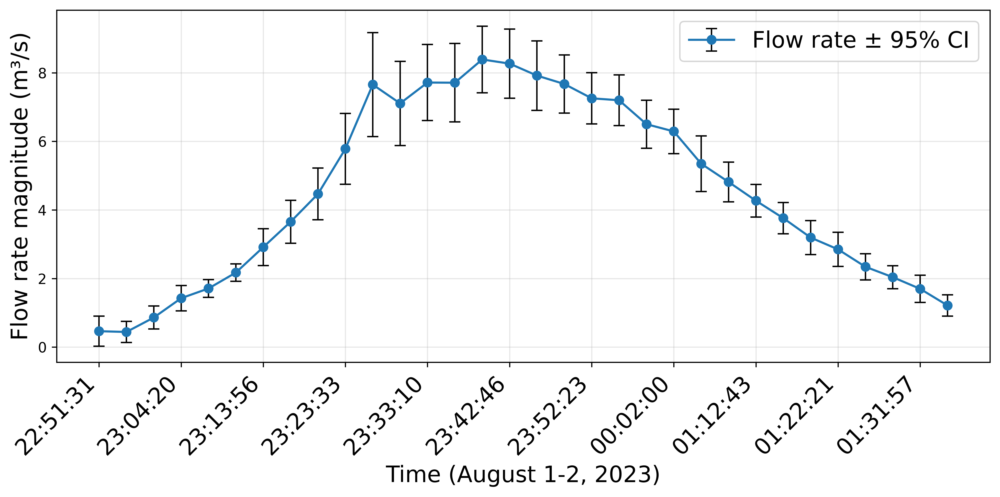

In [5]:
df = CSV.read(joinpath(output_dir, "discharges.csv"), DataFrame)

# Filter out second index and any missing values
filtered_df = filter(row -> !ismissing(row.discharge) && !ismissing(row.Q_CI), df)
filtered_df = filtered_df[Not(2), :]  # remove row 2

times = [Dates.format(Dates.DateTime(ts, "yyyy-mm-dd HH:MM:SS"), "HH:MM:SS") 
        for ts in filtered_df.timestamp]
discharge = filtered_df.discharge
Q_err = filtered_df.Q_CI

# ===== Plot =====
fig, ax = plt.subplots(figsize=(10,5), dpi=600)

# Error bars
ax.errorbar(
    1:length(times),   # x-coordinates as numeric indices
    -discharge,
    yerr = Q_err,
    fmt = "o-",              # circle marker with line
    ecolor = "black",
    elinewidth = 1,
    capsize = 4,
    label = "Flow rate ± 95% CI"
)

# Replace numeric x-axis with timestamp labels
tick_indices = 1:3:length(times)
ax.set_xticks(tick_indices)
ax.set_xticklabels(times[tick_indices], rotation=45, ha="right", fontsize = 16)

ax.set_xlabel("Time (August 1-2, 2023)", fontsize = 16)
ax.set_ylabel("Flow rate magnitude (m³/s)", fontsize = 16)
ax.grid(true, alpha=0.3)
ax.legend(fontsize = 16)

plt.tight_layout()
plt.gcf()